# MapTheMap Orthomosaic Creator

Implemented by Pratham Shah, 240905614, for the final taskphase of Project MANAS.

Brief summary:
- ML algorithms used: 1x CNN (Unet for Road detection), 1x DBScan for feature density-based image clustering.
- Core idea: I am given a list of random images. I should be able to compute each image's features and return clustered stitched images

## Imports

In [ ]:
import os
import re
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from roads import show_roads

from utils2 import Orthomosaic

2025-04-20 16:05:41.883969: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-20 16:05:41.893228: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745145341.903373   32797 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745145341.906549   32797 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-20 16:05:41.918084: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

## Image classification

Based on feature cosine similarity with reference points

In [2]:
def classify_images(image_paths, ref_A_path, ref_B_path):
    stitcher = Orthomosaic(debug=False)
    ref_A = cv2.imread(ref_A_path) #the 2 reference images
    ref_B = cv2.imread(ref_B_path)
    results = []

    for img_path in tqdm(image_paths, desc="Classifying"):
        img = cv2.imread(img_path)
        try:
            if stitcher.sticher(ref_A, img)[1]: # stitching status
                results.append((img_path, "A"))
            elif stitcher.sticher(ref_B, img)[1]:
                results.append((img_path, "B"))
            else:
                results.append((img_path, "Other"))
        except Exception as e:
            print(f"[ERROR] Failed on {img_path}: {e}")
            results.append((img_path, "Error"))

    return results

## Image Stitcher (Uses Orthomosaic's sticher method)

Stitches images on top of a reference image

In [3]:
def stitch(image_paths, reference_path):
    stitcher = Orthomosaic(debug=False)
    images = [cv2.imread(p) for p in image_paths]
    stitcher.load_images(images)
    ref = cv2.imread(reference_path)
    result = stitcher.mixer(reference_image=ref)
    return result

## Road Detection

Using a Unet convolutional neural network and the Massachussets Roads Dataset

In [4]:
import numpy as np
import cv2

def overlay_roads(image):
    # get road mask from show_roads
    road_mask = show_roads(image)  # should return binary mask (H, W) or (H, W, 1)

    # if mask is not 2D then squeeze it
    if road_mask.ndim == 3:
        road_mask = np.squeeze(road_mask)

    # resize
    road_mask_resized = cv2.resize(road_mask.astype(np.uint8), (image.shape[1], image.shape[0]), interpolation=cv2.INTER_NEAREST)
    road_mask_resized = road_mask_resized.astype(bool)

    # pink overlay
    pink_overlay = np.zeros_like(image)
    pink_overlay[..., 0] = 255  # Red
    pink_overlay[..., 1] = 105  # Green
    pink_overlay[..., 2] = 180  # Blue

    # blending mask
    if road_mask_resized.ndim == 2:
        mask_expanded = np.stack([road_mask_resized] * 3, axis=-1)
    else:
        mask_expanded = road_mask_resized

    alpha = 0.5
    overlayed_image = np.where(
        mask_expanded,
        ((1 - alpha) * image + alpha * pink_overlay),
        image
    ).astype(np.uint8)

    return overlayed_image


## Reading the files and implementing stitching


 -> Processing: a_18


Classifying: 100%|██████████| 8/8 [00:00<00:00, 138.09it/s]
I0000 00:00:1745145344.239551   32894 service.cc:148] XLA service 0x768c18005600 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1745145344.239622   32894 service.cc:156]   StreamExecutor device (0): Host, Default Version
2025-04-20 16:05:44.263403: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1745145344.520528   32894 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


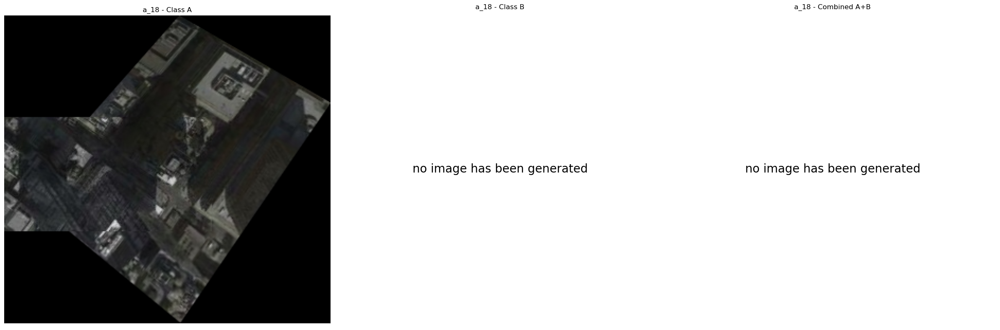


 -> Processing: a_1


Classifying: 100%|██████████| 22/22 [00:00<00:00, 123.13it/s]


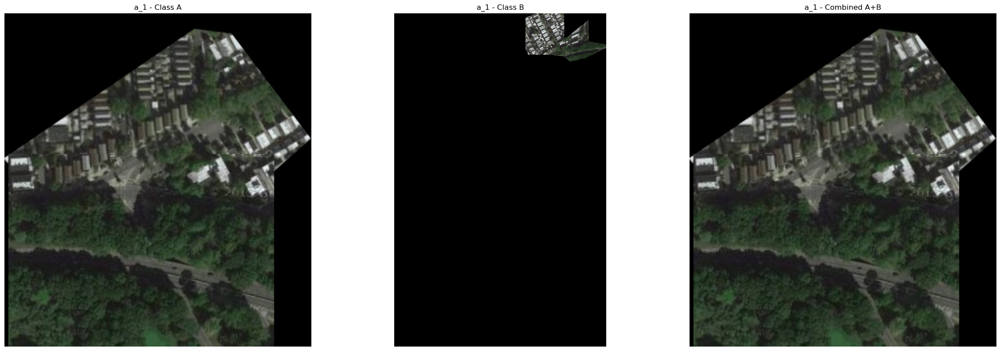


 -> Processing: a_16


Classifying: 100%|██████████| 9/9 [00:00<00:00, 163.17it/s]


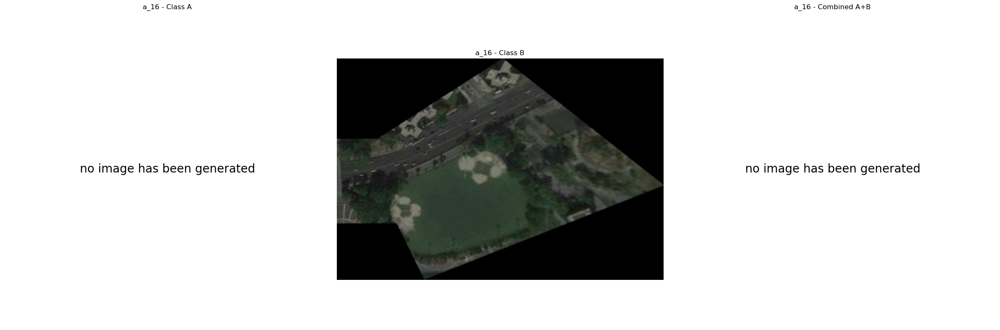


 -> Processing: a_7


Classifying: 100%|██████████| 10/10 [00:00<00:00, 139.51it/s]


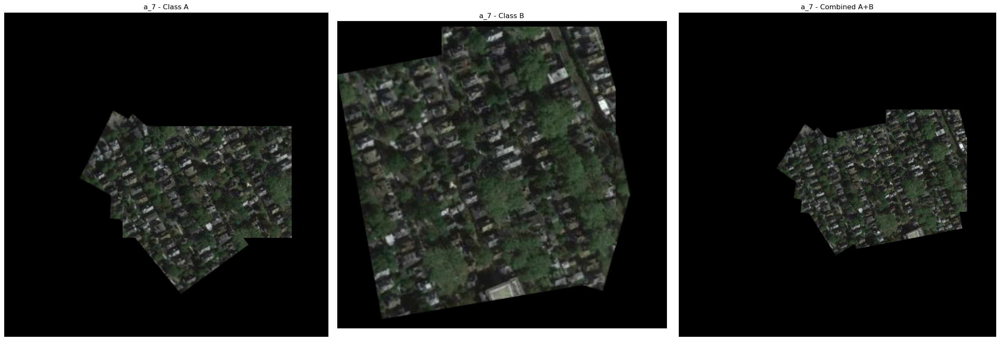


 -> Processing: a_4


Classifying: 100%|██████████| 17/17 [00:00<00:00, 186.25it/s]


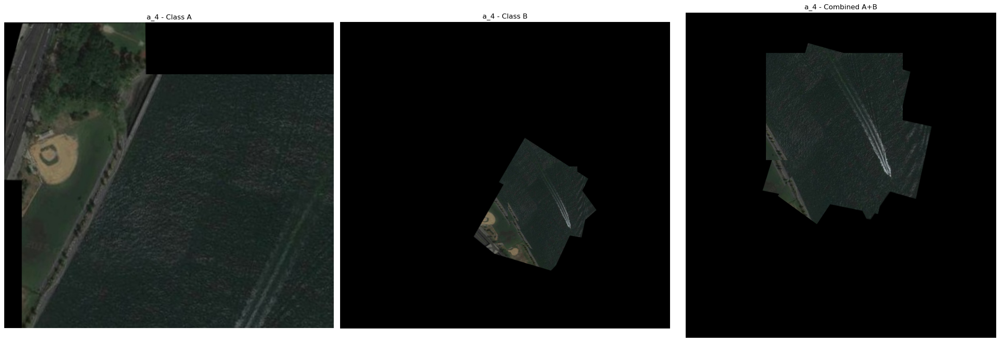


 -> Processing: a_9


Classifying: 100%|██████████| 4/4 [00:00<00:00, 63.65it/s]


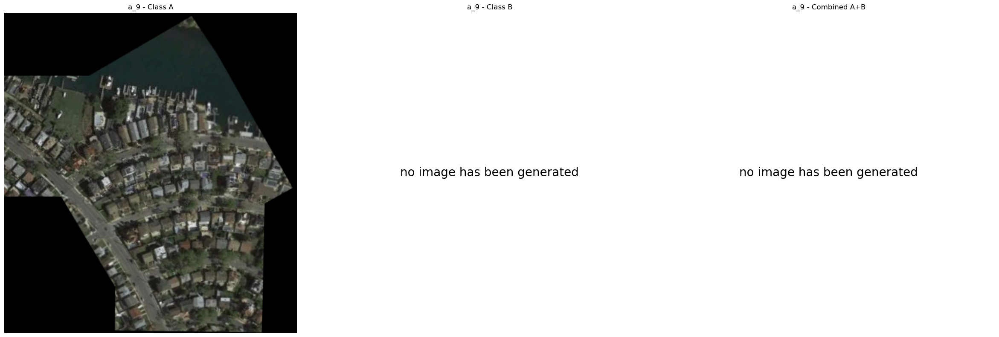


 -> Processing: a_12


Classifying: 100%|██████████| 10/10 [00:00<00:00, 141.72it/s]


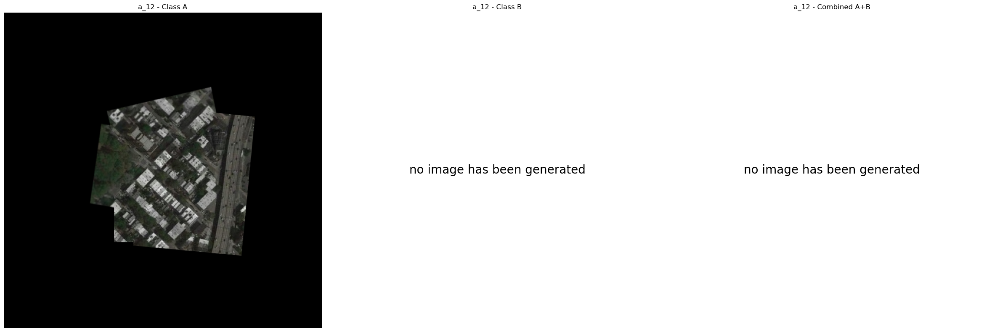


 -> Processing: a_10


Classifying: 100%|██████████| 6/6 [00:00<00:00, 134.85it/s]


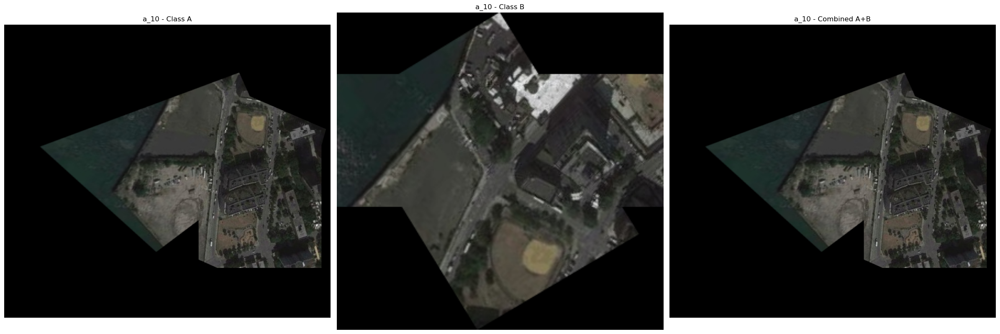


 -> Processing: a_14


Classifying: 100%|██████████| 6/6 [00:00<00:00, 146.04it/s]


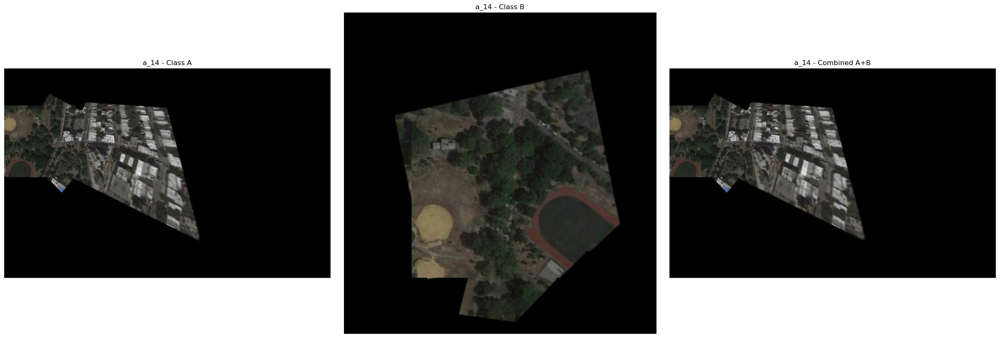


 -> Processing: a_2


Classifying: 100%|██████████| 18/18 [00:00<00:00, 84.60it/s]


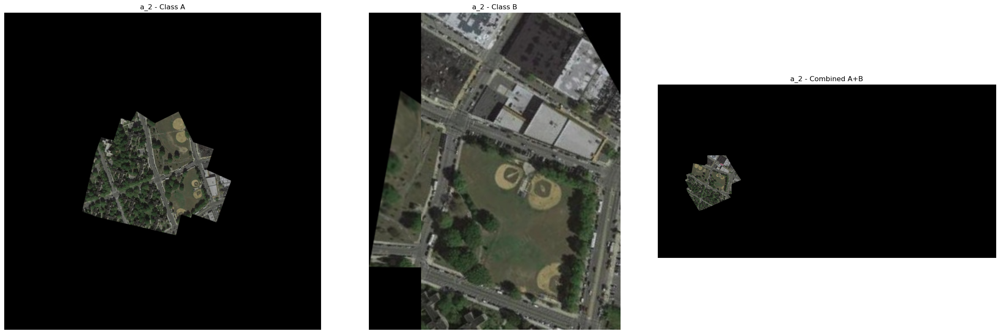


 -> Processing: a_11


Classifying: 100%|██████████| 10/10 [00:00<00:00, 108.61it/s]


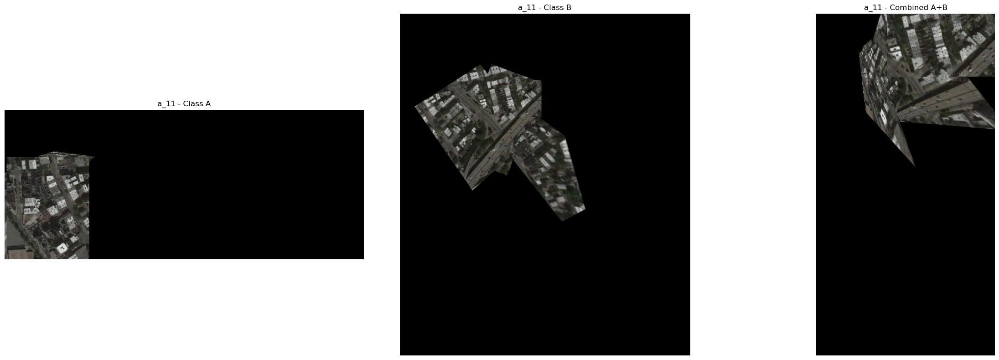


 -> Processing: a_3


Classifying: 100%|██████████| 20/20 [00:00<00:00, 66.53it/s]


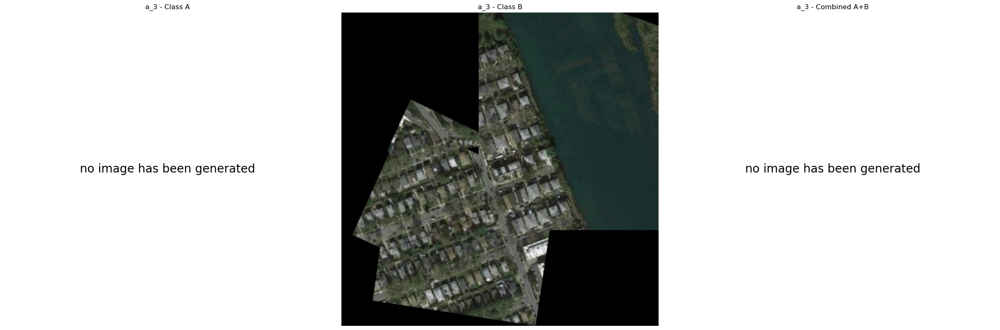


 -> Processing: a_13


Classifying: 100%|██████████| 7/7 [00:00<00:00, 87.22it/s]


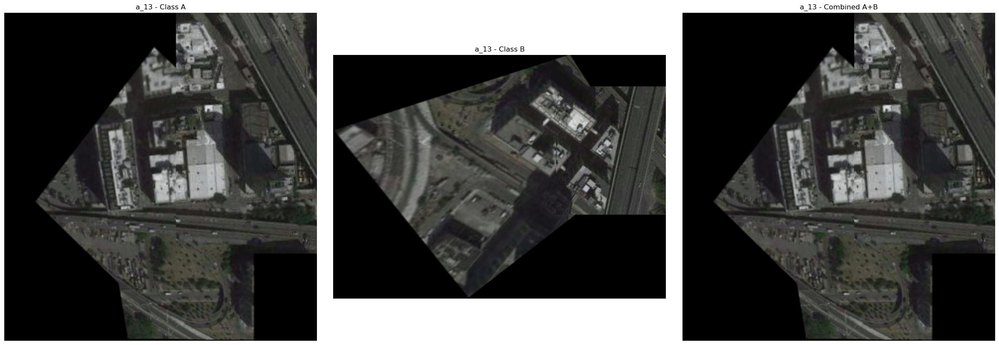


 -> Processing: a_6


Classifying: 100%|██████████| 16/16 [00:00<00:00, 113.24it/s]


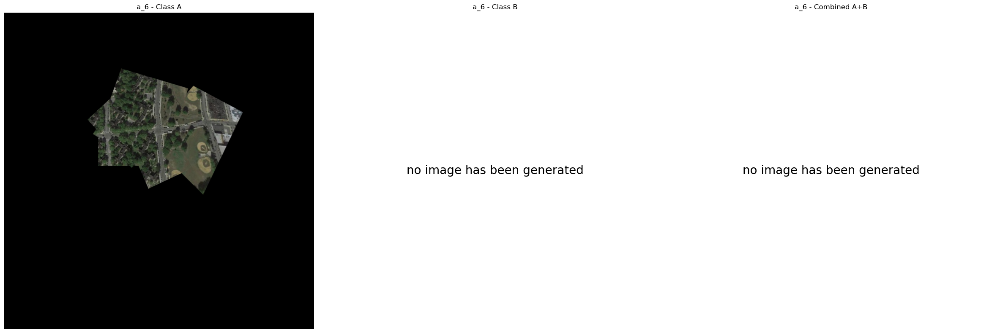


 -> Processing: a_20


Classifying: 100%|██████████| 12/12 [00:00<00:00, 401.69it/s]


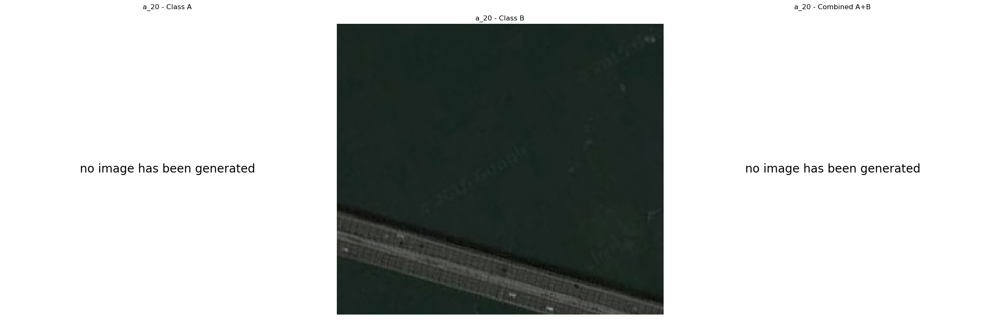


 -> Processing: a_5


Classifying: 100%|██████████| 17/17 [00:00<00:00, 77.96it/s]


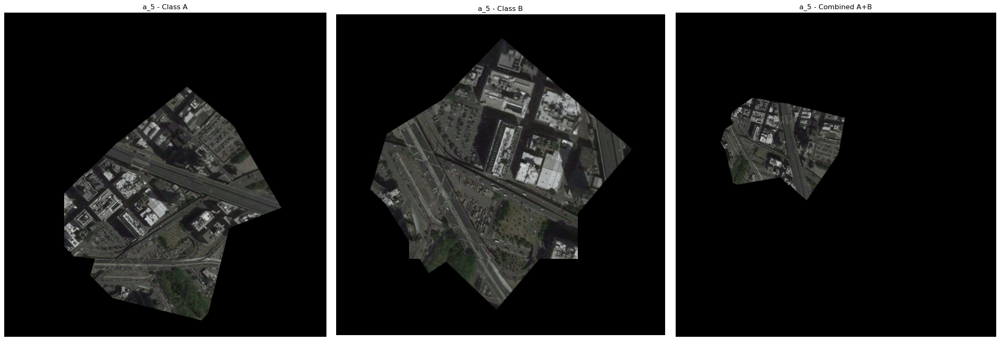


 -> Processing: a_17


Classifying: 100%|██████████| 3/3 [00:00<00:00, 78.08it/s]


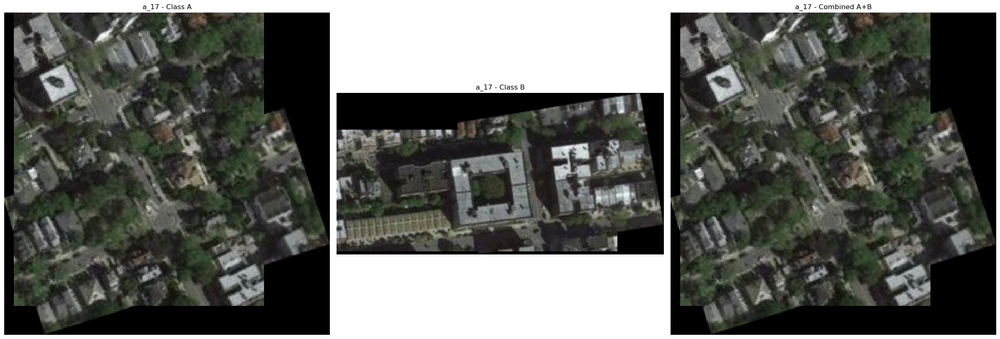


 -> Processing: a_19


Classifying: 100%|██████████| 3/3 [00:00<00:00, 94.57it/s]


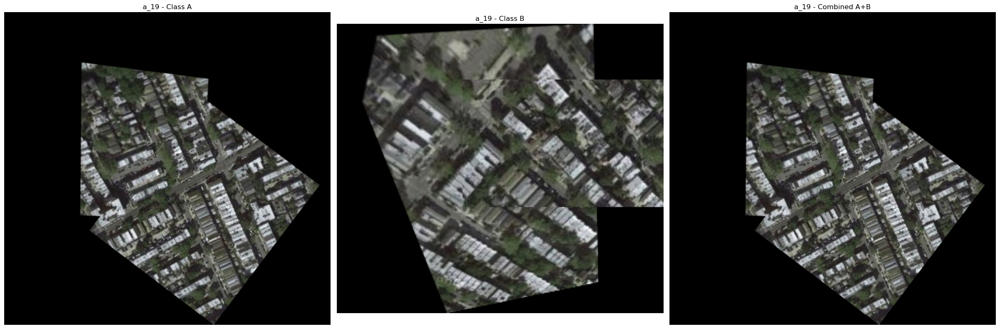

In [5]:
filename_pattern = re.compile(r'filename:\s*(roi_\d+\.jpg)') #regex for geoposition text file
root_dir = "test_s_imgs"
os.makedirs("results", exist_ok=True)

for subdir in os.listdir(root_dir):
    subdir_path = os.path.join(root_dir, subdir)
    if not os.path.isdir(subdir_path):
        continue

    txt_files = [f for f in os.listdir(subdir_path) if f.endswith('.txt')]
    if not txt_files:
        continue

    txt_path = os.path.join(subdir_path, txt_files[0])
    with open(txt_path, 'r') as f:
        content = f.read()

    matches = filename_pattern.findall(content)
    if len(matches) < 2:
        continue

    ref_A_path = os.path.join(subdir_path, matches[0]) #ref images paths
    ref_B_path = os.path.join(subdir_path, matches[1])

    all_images = [f for f in os.listdir(subdir_path) if f.endswith('.jpg')]
    image_paths = [os.path.join(subdir_path, f) for f in all_images if f not in matches]

    print(f"\n -> Processing: {subdir}")
    results = classify_images(image_paths, ref_A_path, ref_B_path)
    A_images = [img for img, label in results if label == "A"]
    B_images = [img for img, label in results if label == "B"]
    
    stitched_images = []

    # final stitching the images based on their relation with A or B. then all B images are stitched on As mosaic
    if A_images:
        output_A = os.path.join("results", f"{subdir}_A_stitched.jpg")
        figureA = stitch(A_images, ref_A_path)
        cv2.imwrite(output_A, figureA)
        stitched_images.append(("Class A", figureA))
    else:
        stitched_images.append(("Class A", None))

    if B_images:
        output_B = os.path.join("results", f"{subdir}_B_stitched.jpg")
        figureB = stitch(B_images, ref_B_path)
        cv2.imwrite(output_B, figureB)
        stitched_images.append(("Class B", figureB))
    else:
        stitched_images.append(("Class B", None))

    if A_images and B_images:
        combined = figureA.copy()
        stitcher = Orthomosaic(debug=False)
        for b_img_path in B_images:
            b_img = cv2.imread(b_img_path)
            result, success = stitcher.sticher(combined, b_img)
            if success:
                combined = result
        output_AB = os.path.join("results", f"{subdir}_A+B_stitched.jpg")
        cv2.imwrite(output_AB, combined)
        stitched_images.append(("Combined A+B", combined))
    else:
        stitched_images.append(("Combined A+B", None))
    
    fig, axs = plt.subplots(1, 3, figsize=(24, 8))
    for idx, (title, img) in enumerate(stitched_images):
        axs[idx].axis('off')
        axs[idx].set_title(f"{subdir} - {title}")
        if img is not None:
            axs[idx].imshow(overlay_roads(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)))
        else:
            axs[idx].text(0.5, 0.5, "no image has been generated", fontsize=20, ha='center', va='center')

    plt.tight_layout()
    plt.show()